<h1 style="text-align: center;" markdown="1">Machine Learning Algorithms for Digital Wage Payment Prediction</h1> 
<h2 style="text-align: center;" markdown="2">An AIMS Masters project in Collaboration with the Global Centre on Digital Wages for Decent Work (ILO)</h2>


> *The widespread adoption of digital payments has become increasingly important. In light of this, the aim of this project is to investigate the probability of an individual receiving digital wages in Africa. To achieve this, a series of empirical comparative assessments of machine learning classification algorithms will be conducted. The objective is to determine the effectiveness of these algorithms in predicting digital wage payments. Therefore, this notebook forms part of a larger project that seeks to explore the potential of machine learning in addressing issues related to financial inclusion in Africa.*

<h1 style="text-align: center;" markdown="3">Algorithm 4 - XGBoost Classifier</h1> 
<h2 style="text-align: center;" markdown="3">Part 1: Full Feature Set</h2> 

# Table of Contents

[Introduction](#setup)  
[No Sample Weights](#noweights)    
[Sample Weights](#weights)  
[Cross-Validation and Parameter Tuning](#cross-validation)   
[XGBoost Summary](#summary)

# Introduction <a class="anchor" id="introduction"></a>

We will now apply the XGBoost classifier to the dataset. 

As always, we start with loading our standard libraries and the data

In [1]:
import os
import sys

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
from IPython.display import display
import seaborn as sns
sns.set()
plt.style.use('fivethirtyeight')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.metrics import recall_score, f1_score, cohen_kappa_score, average_precision_score
from imblearn.metrics import specificity_score

# Add our local functions to the path
sys.path.append(os.path.join(os.pardir, 'src'))
from models import evaluation
from data.load_data import (get_data_filepaths, 
                            split_features_labels_weights)



ALGORITHM_NAME = 'xgb'
COUNTRY = 'full_merged'

TRAIN_PATH, TEST_PATH = get_data_filepaths(COUNTRY)


# No Sample Weights <a class="anchor" id="noweights"></a>

Now let's apply the XGBoost classifier to the dataset with no weights.

In [2]:
# Create DataFrame of feature importances
def get_feat_imp_df(feat_imps, index=None, sort=True):
    feat_imps = pd.DataFrame(feat_imps, columns=['importance'])
    if index is not None:
        feat_imps.index = index
    if sort:
        feat_imps = feat_imps.sort_values('importance', ascending=False)
    return feat_imps

CPU times: user 1.01 s, sys: 0 ns, total: 1.01 s
Wall time: 70.4 ms
CPU times: user 63 ms, sys: 0 ns, total: 63 ms
Wall time: 3.43 ms
In-sample score: 97.18%


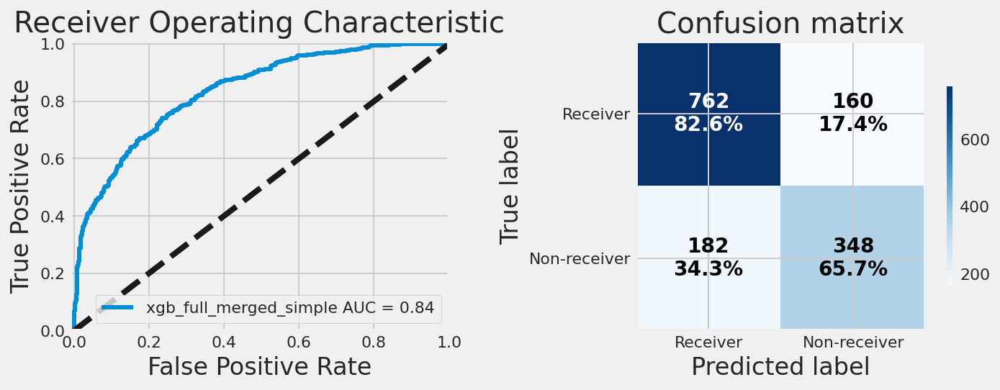

,xgb_full_merged_simple
accuracy,0.764463
recall,0.826464
precision,0.807203
f1,0.816720
cross_entropy,0.550121
roc_auc,0.836301
cohen_kappa,0.487369


In [3]:
# Load and transform the training data
X_train, y_train, w_train = split_features_labels_weights(TRAIN_PATH)


# Fit the model
model = XGBClassifier(tree_method="hist", objective='binary:logistic', enable_categorical=True, max_cat_to_onehot=1)
%time model.fit(X_train.to_numpy(), y_train)

# Get an initial score
%time score = model.score(X_train.to_numpy(), y_train)
print("In-sample score: {:0.2%}".format(score))
feat_imps = get_feat_imp_df(model.feature_importances_, index=X_train.columns)

# Load the test set
X_test, y_test, w_test = split_features_labels_weights(TEST_PATH)

# Run the model
y_pred = model.predict(X_test.to_numpy())
y_prob = model.predict_proba(X_test.to_numpy())[:,1]

# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test, y_pred, y_prob,
                                    store_model=True,
                                    model_name='full_merged_simple', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model,
                                    features=feat_imps,
                                    predict_dig_wage_rate=False)

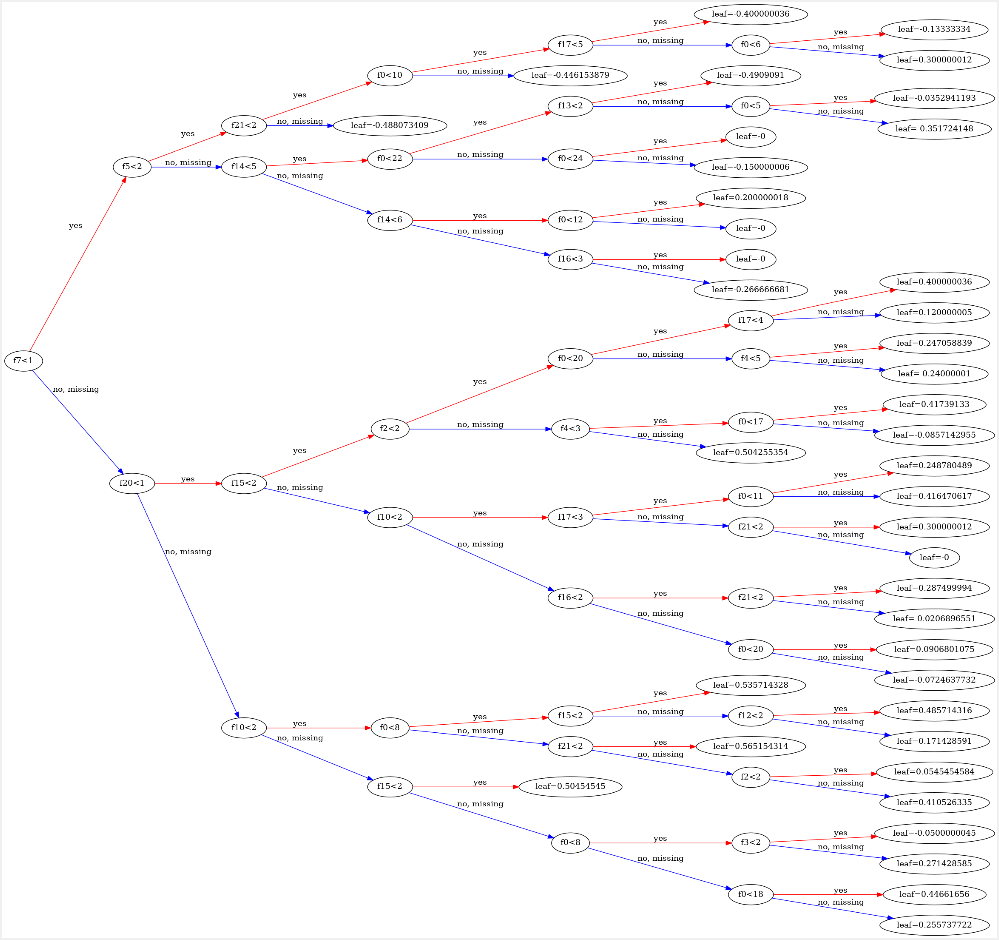

In [4]:
plt.figure(figsize=(100,50))
xgb.plot_tree(model, num_trees=0, ax=plt.subplot(), rankdir='LR')
plt.show()

In [5]:
feature_names = X_train.columns

# Sample weights <a class="anchor" id="weights">

Next, we will incorporate the sample weights that came with the dataset, enabling us to generalize our model results to the overall population.

CPU times: user 11.6 s, sys: 0 ns, total: 11.6 s
Wall time: 786 ms
CPU times: user 63.4 ms, sys: 0 ns, total: 63.4 ms
Wall time: 3.38 ms
In-sample score: 97.29%


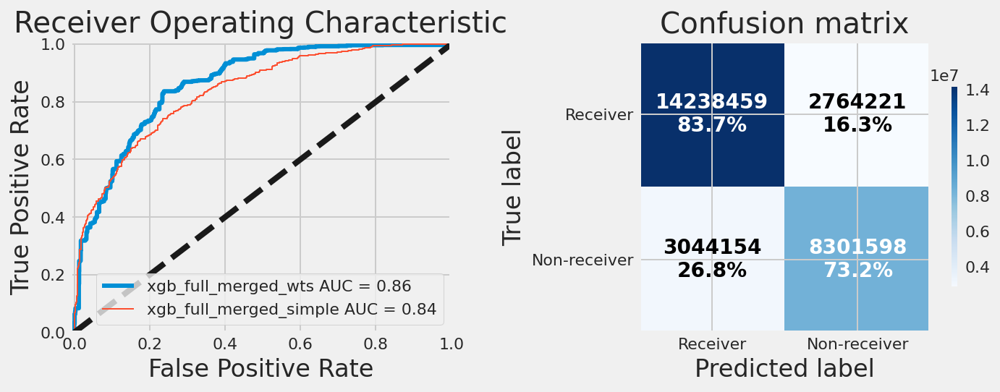

,xgb_full_merged_wts,xgb_full_merged_simple
accuracy,0.795108,0.764463
recall,0.837424,0.826464
precision,0.823860,0.807203
f1,0.830587,0.816720
cross_entropy,0.620190,0.550121
roc_auc,0.863218,0.836301
cohen_kappa,0.479218,0.487369


In [6]:
# Load and transform the training data
X_train, y_train, w_train = split_features_labels_weights(TRAIN_PATH)

# Fit the model
model = XGBClassifier(tree_method="hist", objective='binary:logistic', enable_categorical=True, max_cat_to_onehot=1)
%time model.fit(X_train.to_numpy(), y_train, sample_weight=w_train)

# Get an initial score
%time score = model.score(X_train.to_numpy(), y_train)
print("In-sample score: {:0.2%}".format(score))
feat_imps = get_feat_imp_df(model.feature_importances_, index=X_train.columns)

# Load the test set
X_test, y_test, w_test = split_features_labels_weights(TEST_PATH)

# Run the model
y_pred = model.predict(X_test.to_numpy())
y_prob = model.predict_proba(X_test.to_numpy())[:,1]

w_test = w_test.to_numpy()
# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test, y_pred, y_prob, w_test.reshape(-1), 
                                    compare_models='xgb_full_merged_simple',
                                    store_model=True,
                                    model_name='full_merged_wts', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model,
                                    features=feat_imps,
                                    predict_dig_wage_rate=False)

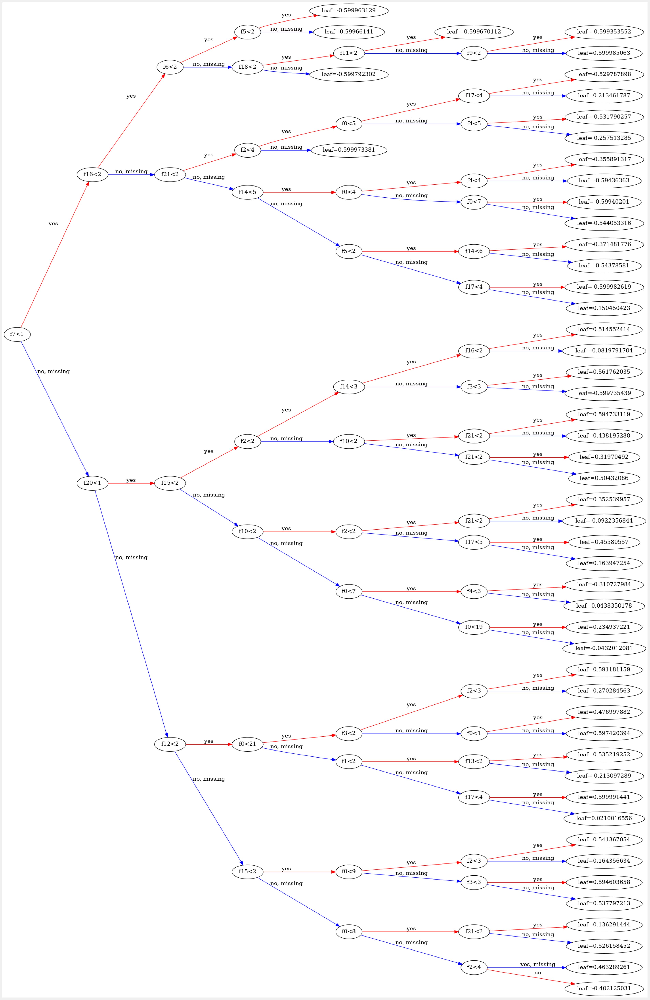

In [7]:
plt.figure(figsize=(100,50))
xgb.plot_tree(model, num_trees=0, ax=plt.subplot(), rankdir='LR')
plt.show()

## Cross-validation and Parameter Tuning <a class="anchor" id="cross-validation"></a>

Now we do cross-validation when fitting the  model and try to find the best parameters through hyperparameter tuning.

CPU times: user 2h 6min 55s, sys: 7.86 s, total: 2h 7min 3s
Wall time: 7min 58s
CPU times: user 58.8 ms, sys: 0 ns, total: 58.8 ms
Wall time: 3.26 ms
In-sample score: 83.72%
Best model parameters: {'eval_metric': 'logloss', 'gamma': 100, 'learning_rate': 0.2, 'max_delta_step': 5, 'n_estimators': 25, 'scale_pos_weight': 1, 'subsample': 0.7}


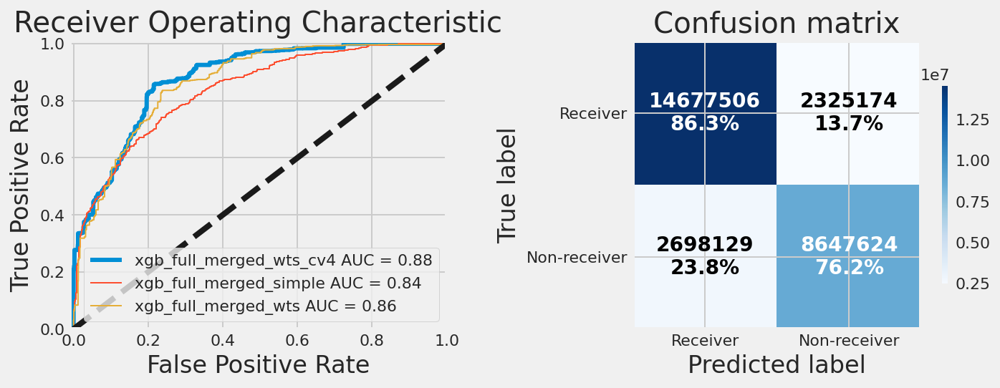

,xgb_full_merged_wts_cv4,xgb_full_merged_simple,xgb_full_merged_wts
accuracy,0.822801,0.764463,0.795108
recall,0.863247,0.826464,0.837424
precision,0.844718,0.807203,0.823860
f1,0.853882,0.816720,0.830587
cross_entropy,0.434519,0.550121,0.620190
roc_auc,0.877255,0.836301,0.863218
cohen_kappa,0.514427,0.487369,0.479218


In [8]:
scorers = {
    'kappa': make_scorer(cohen_kappa_score),
    'f1': make_scorer(f1_score),
    'recall': make_scorer(recall_score),
    'precision': make_scorer(average_precision_score),
    'specificity': make_scorer(specificity_score)
}


# Load and transform the training data
X_train, y_train, w_train = split_features_labels_weights(TRAIN_PATH)

# build the model
estimator = XGBClassifier(tree_method="hist", objective='binary:logistic', enable_categorical=True, 
                          max_cat_to_onehot=1, booster='gbtree', verbosity=0)

# parameters = {'max_depth': np.arange(3,9,3),
#               'nthread':[4],
#               'learning_rate': [0.01, 0.1, 0.2],
#               'min_child_weight': np.arange(0,10,2),
# #               'max_delta_step': np.arange(0,10,5),
#               'subsample': [0.7, 0.75, 0.8],
#               'colsample_bytree': [0.7, 0.8],
#               'n_estimators': [10, 20, 25, 30],
#               'gamma': [0.1, 1],
#               'verbosity': [0],
# #               'reg_alpha': [0.001, 0.01, 0.1, 1],
# #               'reg_lambda': [0.001, 0.01, 0.1, 1],
# #               'scale_pos_weight': [3, 5, 7.85],
# #               'random_state': np.arange(0, 2000, 10),
#               'enable_categorical': [True],
#               'max_cat_to_onehot': [1],
#               'grow_policy':[0, 1],
#               'eval_metric': ['logloss', 'error', 'aucpr']
#              }

# parameters = {'gamma': [1, 10, 100],
#                  'n_estimators': [10, 20, 25, 30],
#                  'learning_rate': [0.01, 0.1, 0.2, 0.3],
# #               'colsample_bytree': [0.6, 0.8],
#               'subsample': [0.7, 0.75, 0.8],
#                  'scale_pos_weight': [1, 2, 3, 5],
#               'max_delta_step': [1],
# #                  'eval_metric': ['logloss', 'error', 'aucpr']
#              }

parameters = {'gamma': [1, 10, 100],
              'n_estimators': [10, 20, 25, 30],
              'learning_rate': [0.01, 0.1, 0.2, 0.3],
              'subsample': [0.7, 0.75, 0.8],
              'scale_pos_weight': [1, 2, 3, 5],
              'max_delta_step': [1],
              'max_delta_step': np.arange(1,10,2),
              'eval_metric': ['logloss', 'error', 'aucpr']
             }



# Use stratified KFold for the cross-validation given the imbalanced data
kf = StratifiedKFold(n_splits=3)

model = GridSearchCV(estimator, parameters, scoring=scorers, refit='precision', cv=kf, verbose=0)
%time model.fit(X_train.to_numpy(), y_train, sample_weight=w_train)

# Get an initial score
%time score = model.score(X_train.to_numpy(), y_train)
print("In-sample score: {:0.2%}".format(score))
print("Best model parameters:", model.best_params_)

feat_imps = get_feat_imp_df(model.best_estimator_.feature_importances_, index=X_train.columns)

# # Load the test set
X_test, y_test, w_test = split_features_labels_weights(TEST_PATH)

# Run the model
y_pred = model.best_estimator_.predict(X_test.to_numpy())
y_prob = model.best_estimator_.predict_proba(X_test.to_numpy())[:,1]

w_test = w_test.to_numpy()
# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test, y_pred, y_prob, w_test.reshape(-1),
                                    compare_models=['xgb_full_merged_simple',
                                                    'xgb_full_merged_wts'],
                                    store_model=True,
                                    model_name='full_merged_wts_cv4', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model, 
                                    features=feat_imps,
                                    predict_dig_wage_rate=False)
# best_model = model.best_estimator_

In [9]:
model.best_estimator_

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric='logloss',
              feature_types=None, gamma=100, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.2, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=1, max_delta_step=5, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=25, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None, ...)

In [10]:
model.best_score_

0.785415151470923

In [11]:
feat_imps.head(20)

,importance
account,0.535581
merchantpay_dig,0.091269
fin33,0.035414
fin17a,0.033105
fin22a,0.022966
pay_utilities,0.020809
fin17b,0.019382
internet_fin_transc,0.019260
age,0.019045
educ,0.018623


# XGBoost Summary <a class="anchor" id="summary"></a>

We have covered the basic concepts of a XGBoost classifier, and applied it to our dataset. We also explored some techniques for analyzing the performance of our model as well as tuning parameters.

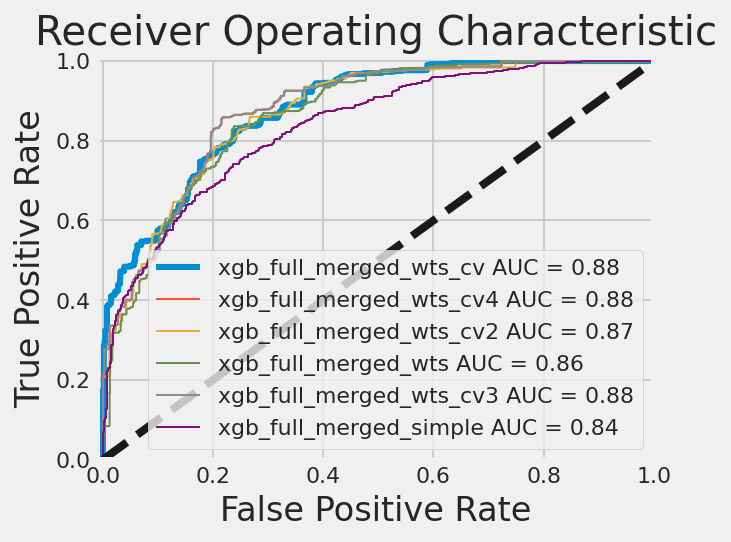

,accuracy,recall,precision,f1,cross_entropy,roc_auc,cohen_kappa
xgb_full_merged_wts_cv,0.799366,0.831742,0.833408,0.832575,0.433072,0.879582,0.492983
xgb_full_merged_wts_cv4,0.822801,0.863247,0.844718,0.853882,0.434519,0.877255,0.514427
xgb_full_merged_wts_cv2,0.802949,0.848251,0.827527,0.837761,0.437295,0.871007,0.485708
xgb_full_merged_wts,0.795108,0.837424,0.823860,0.830587,0.620190,0.863218,0.479218
xgb_full_merged_wts_cv3,0.822801,0.863247,0.844718,0.853882,0.434519,0.877255,0.514427
xgb_full_merged_simple,0.764463,0.826464,0.807203,0.816720,0.550121,0.836301,0.487369


In [12]:
evaluation.compare_algorithm_models(ALGORITHM_NAME, COUNTRY)